In [ ]:
# import os
# os.mkdir("/content/images")
# ! unzip "drive/MyDrive/images.zip" -d "/content/images"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Create a YOLO dataset from the "iamges.zip" and "labels.zip" files

In [ ]:
import numpy as np
import os
import xml.etree.ElementTree as ET
import cv2
from sklearn.model_selection import train_test_split

# Define the function to parse annotation XML files
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    image_info = {
        "file_name": root.find("filename").text,
        "width": int(root.find("size/width").text),
        "height": int(root.find("size/height").text),
        "objects": []
    }

    for obj in root.findall("object"):
        obj_info = {
            "class": obj.find("name").text,
            "bbox": [
                int(obj.find("bndbox/xmin").text),
                int(obj.find("bndbox/ymin").text),
                int(obj.find("bndbox/xmax").text),
                int(obj.find("bndbox/ymax").text)
            ]
        }
        image_info["objects"].append(obj_info)

    return image_info

# Helper function to load and preprocess images
def load_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Helper function to load annotations and images from the given folder structure
def load_annotations_and_images(images_folder, labels_folder):
    images = []
    annotations = []
    file_names = []
    class_mapping = {"buffer": 0, "negative": 1, "positive": 2}

    for class_name in class_mapping.keys():
        class_image_folder = os.path.join(images_folder, class_name)
        class_label_folder = os.path.join(labels_folder, class_name)

        for xml_file in os.listdir(class_label_folder):
            if xml_file.endswith(".xml"):
                xml_path = os.path.join(class_label_folder, xml_file)
                annotation = parse_annotation(xml_path)
                img_path = os.path.join(class_image_folder, annotation["file_name"])

                if os.path.exists(img_path):
                    img = load_image(img_path)
                    images.append(img)
                    annotations.append(annotation)
                    file_names.append(annotation["file_name"])

    return images, annotations, file_names

# Function to save image and labels in YOLO format
def save_yolo_format(images, annotations, file_names, folder):
    class_mapping = {"buffer": 0, "negative": 1, "positive": 2}

    image_folder = os.path.join(folder, "images")
    label_folder = os.path.join(folder, "labels")

    os.makedirs(image_folder, exist_ok=True)
    os.makedirs(label_folder, exist_ok=True)

    for img, annotation, file_name in zip(images, annotations, file_names):
        height, width, _ = img.shape
        img_name, _ = os.path.splitext(file_name)

        # Save the image
        img_path = os.path.join(image_folder, file_name)
        cv2.imwrite(img_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

        # Convert bbox to YOLO format and save the label
        label_path = os.path.join(label_folder, f"{img_name}.txt")
        with open(label_path, 'w') as f:
            for obj in annotation["objects"]:
                cls = class_mapping[obj["class"]]
                bbox = obj["bbox"]
                yolo_bbox = [(bbox[0] + bbox[2]) / 2 / width,
                             (bbox[1] + bbox[3]) / 2 / height,
                             (bbox[2] - bbox[0]) / width,
                             (bbox[3] - bbox[1]) / height]
                f.write(f"{cls} " + " ".join(map(str, yolo_bbox)) + "\n")

# Load annotations and images
images, annotations, file_names = load_annotations_and_images("/content/images", "/content/labels")

# Split the data into training, validation, and test sets
train_images, test_images, train_annotations, test_annotations, train_file_names, test_file_names = train_test_split(
    images, annotations, file_names, test_size=0.1, random_state=42
)
train_images, val_images, train_annotations, val_annotations, train_file_names, val_file_names = train_test_split(
    train_images, train_annotations, train_file_names, test_size=0.25, random_state=42
)

# Create dataset_YOLO folder structure
os.makedirs("dataset_YOLO", exist_ok=True)
save_yolo_format(train_images, train_annotations, train_file_names, os.path.join("dataset_YOLO", "Train"))
save_yolo_format(val_images, val_annotations, val_file_names, os.path.join("dataset_YOLO", "Val"))
save_yolo_format(test_images, test_annotations, test_file_names, os.path.join("dataset_YOLO", "Test"))


In [ ]:
import yaml

def create_yaml_file(folder, class_names):
    data = {
        'train': os.path.join(folder, 'Train', 'images'),
        'val': os.path.join(folder, 'Val', 'images'),
        'test': os.path.join(folder, 'Test', 'images'),
        'nc': len(class_names),  # number of classes
        'names': class_names  # class names
    }

    with open(os.path.join(folder, 'data.yaml'), 'w') as outfile:
        yaml.dump(data, outfile, default_flow_style=False)

class_mapping = {"buffer": 0, "negative": 1, "positive": 2}
class_names = list(class_mapping.keys())

create_yaml_file("dataset_YOLO", class_names)


# Convert the original `ElizaMicroplates` dataset into YOLO format

In [ ]:
import numpy as np
import os
import xml.etree.ElementTree as ET
import cv2
from sklearn.model_selection import train_test_split
import yaml

# Define the function to parse annotation XML files
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    image_info = {
        "file_name": root.find("filename").text,
        "width": int(root.find("size/width").text),
        "height": int(root.find("size/height").text),
        "objects": []
    }

    for obj in root.findall("object"):
        obj_info = {
            "class": obj.find("name").text,
            "bbox": [
                int(obj.find("bndbox/xmin").text),
                int(obj.find("bndbox/ymin").text),
                int(obj.find("bndbox/xmax").text),
                int(obj.find("bndbox/ymax").text)
            ]
        }
        image_info["objects"].append(obj_info)

    return image_info

# Helper function to load and preprocess images
def load_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Helper function to load annotations and images from the given folder structure
def load_annotations_and_images(images_folder, labels_folder):
    images = []
    annotations = []
    file_names = []
    class_mapping = {}

    for xml_file in os.listdir(labels_folder):
        if xml_file.endswith(".xml"):
            xml_path = os.path.join(labels_folder, xml_file)
            annotation = parse_annotation(xml_path)
            img_path = os.path.join(images_folder, annotation["file_name"])

            if os.path.exists(img_path):
                img = load_image(img_path)
                images.append(img)
                annotations.append(annotation)
                file_names.append(annotation["file_name"])

                for obj in annotation["objects"]:
                    class_name = obj["class"]
                    if class_name not in class_mapping:
                        class_mapping[class_name] = len(class_mapping)

    return images, annotations, file_names, class_mapping

# Function to save image and labels in YOLO format
def save_yolo_format(images, annotations, file_names, folder, class_mapping):
    image_folder = os.path.join(folder, "images")
    label_folder = os.path.join(folder, "labels")

    os.makedirs(image_folder, exist_ok=True)
    os.makedirs(label_folder, exist_ok=True)

    for img, annotation, file_name in zip(images, annotations, file_names):
        height, width, _ = img.shape
        img_name, _ = os.path.splitext(file_name)

        # Save the image
        img_path = os.path.join(image_folder, file_name)
        cv2.imwrite(img_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

        # Convert bbox to YOLO format and save the label
        label_path = os.path.join(label_folder, f"{img_name}.txt")
        with open(label_path, 'w') as f:
            for obj in annotation["objects"]:
                cls = class_mapping[obj["class"]]
                bbox = obj["bbox"]
                yolo_bbox = [(bbox[0] + bbox[2]) / 2 / width,
                             (bbox[1] + bbox[3]) / 2 / height,
                             (bbox[2] - bbox[0]) / width,
                             (bbox[3] - bbox[1]) / height]
                f.write(f"{cls} " + " ".join(map(str, yolo_bbox)) + "\n")

# Function to create the data.yaml file
def create_yaml_file(folder, class_mapping):
    data = {
        'train': os.path.join(folder, 'Train', 'images'),
        'val': os.path.join(folder, 'Val', 'images'),
        'test': os.path.join(folder, 'Test', 'images'),
        'nc': len(class_mapping),  # number of classes
        'names': list(class_mapping.keys())  # class names
    }

    with open(os.path.join(folder, 'data.yaml'), 'w') as outfile:
        yaml.dump(data, outfile, default_flow_style=False)

# Load annotations and images from MICROPLATES dataset
images_folder = "/content/drive/MyDrive/Eliza Microplates DATASET/images"
labels_folder = "/content/drive/MyDrive/Eliza Microplates DATASET/vocxml"
images, annotations, file_names, class_mapping = load_annotations_and_images(images_folder, labels_folder)

# Split the data into training, validation, and test sets
train_images, test_images, train_annotations, test_annotations, train_file_names, test_file_names = train_test_split(
    images, annotations, file_names, test_size=0.1, random_state=42
)
train_images, val_images, train_annotations, val_annotations, train_file_names, val_file_names = train_test_split(
    train_images, train_annotations, train_file_names, test_size=0.25, random_state=42
)

# Create dataset_YOLO_Microplates folder structure
output_folder = "dataset_YOLO_Microplates"
os.makedirs(output_folder, exist_ok=True)
save_yolo_format(train_images, train_annotations, train_file_names, os.path.join(output_folder, "Train"), class_mapping)
save_yolo_format(val_images, val_annotations, val_file_names, os.path.join(output_folder, "Val"), class_mapping)
save_yolo_format(test_images, test_annotations, test_file_names, os.path.join(output_folder, "Test"), class_mapping)

# Create the data.yaml file
create_yaml_file(output_folder, class_mapping)


# YOLO TRIANING

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16631, done.
remote: Counting objects: 100% (109/109), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 16631 (delta 62), reused 69 (delta 31), pack-reused 16522
Receiving objects: 100% (16631/16631), 15.15 MiB | 11.18 MiB/s, done.
Resolving deltas: 100% (11415/11415), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 57.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.8/778.8 kB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.31.0, but you 

In [ ]:
import os
os.getcwd()

'/content/yolov5'

In [ ]:
!python train.py --img 736 --batch 16 --epochs 35 --data ../drive/MyDrive/dataset_YOLO_Microplates/data.yaml --weights yolov5s.pt --cache

2024-05-29 12:19:43.963523: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-29 12:19:43.963571: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-29 12:19:43.964974: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=../drive/MyDrive/dataset_YOLO_Microplates/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=35, batch_size=16, imgsz=736, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, m

Successfully moved /content/yolov5 to /content/drive/MyDrive


In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 1080 --conf 0.1 --source ../drive/MyDrive/dataset_YOLO_Microplates/Test/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=../drive/MyDrive/dataset_YOLO_Microplates/Test/images, data=data/coco128.yaml, imgsz=[1080, 1080], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-315-g892e8a82 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [1080, 1080] must be multiple of max stride 32, updating to [1088, 1088]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/10 /content/drive/.shortcut-targets-by-id/1K8WZb75rwhOnrGuO00QGxnzzB1Jt5Exc/dataset_YOLO_Microplates/Test/images/20.png: 672x1088 102

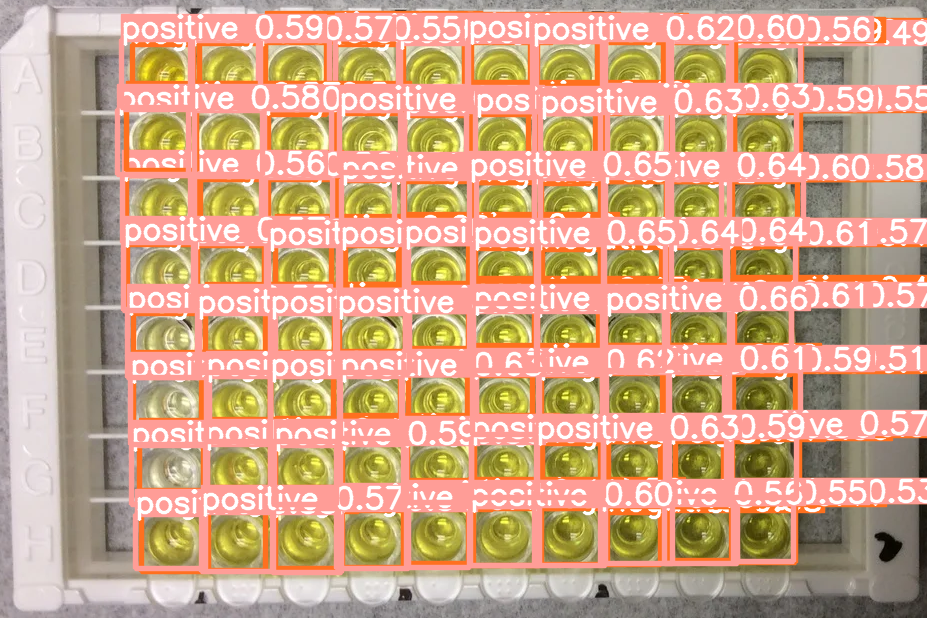

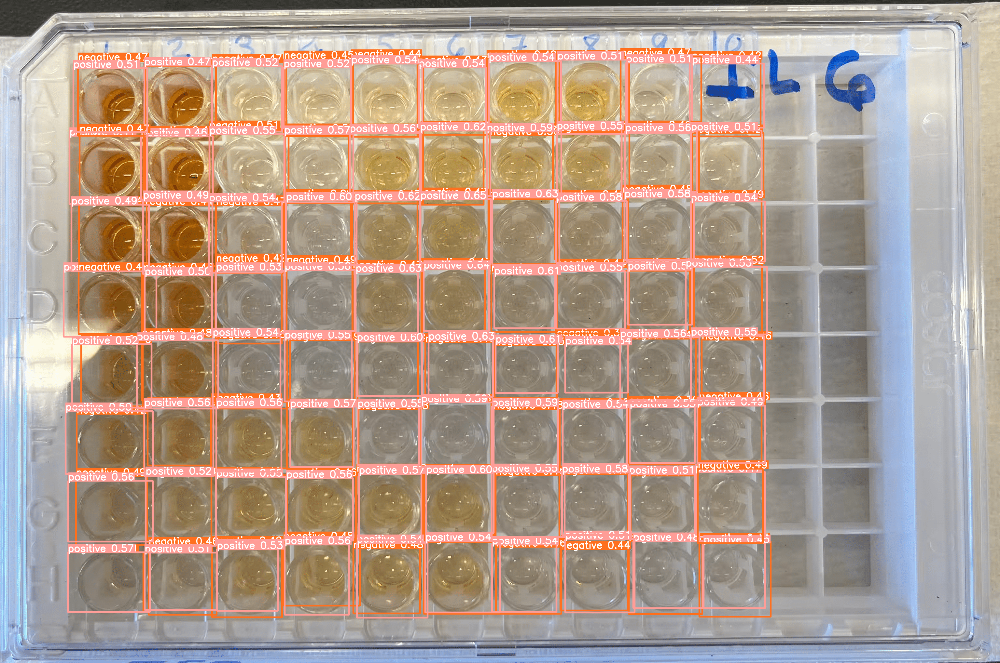

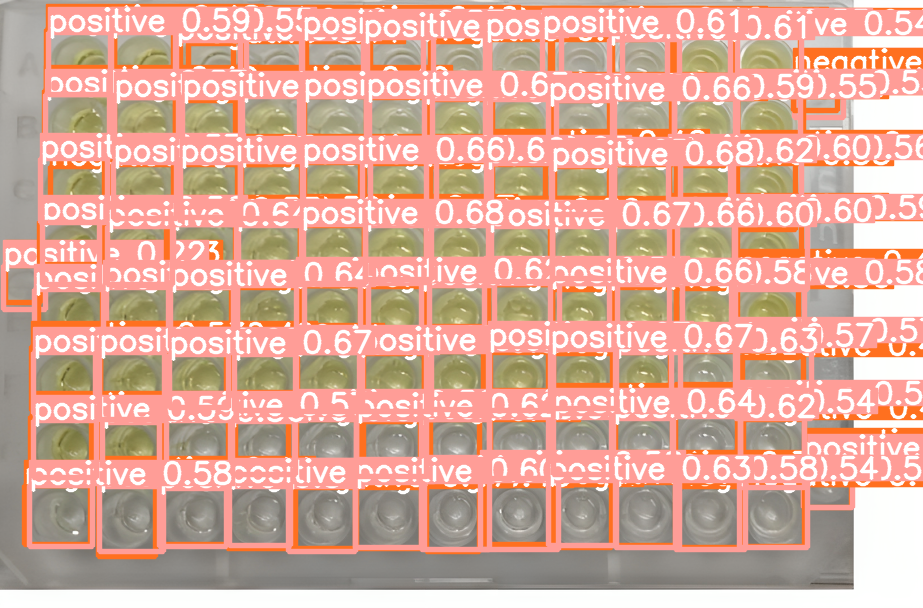

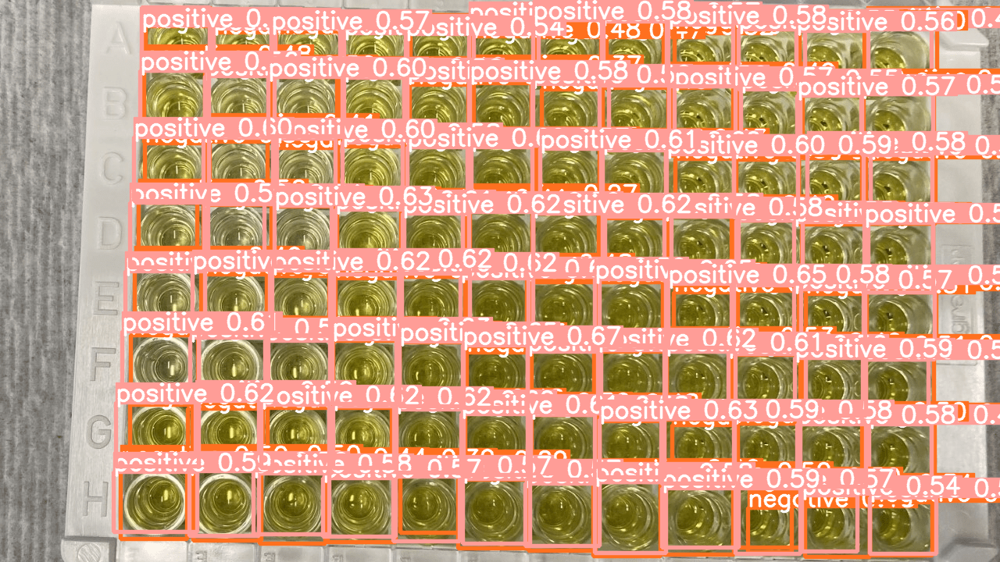

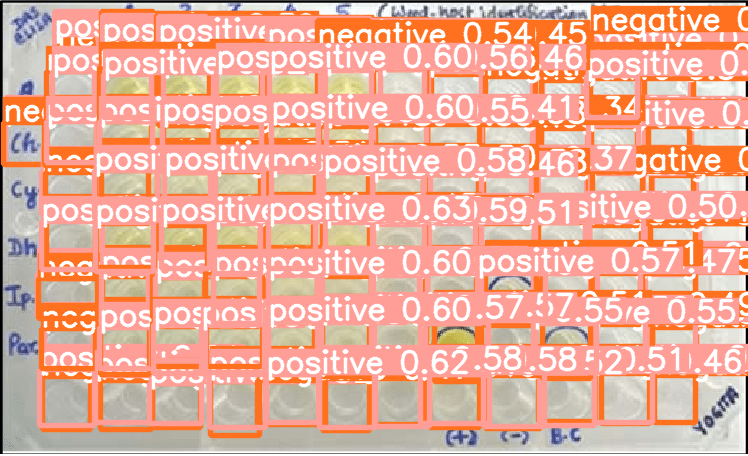

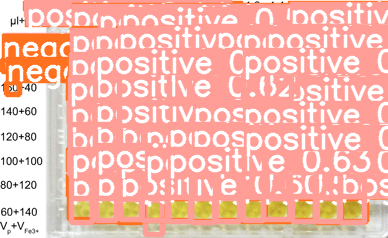

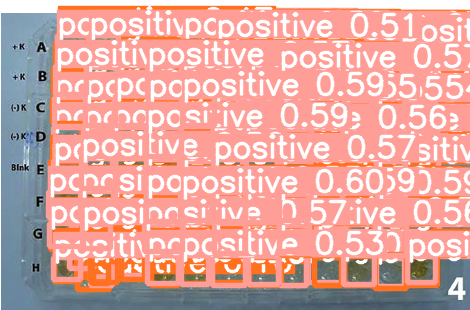

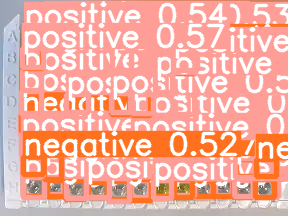

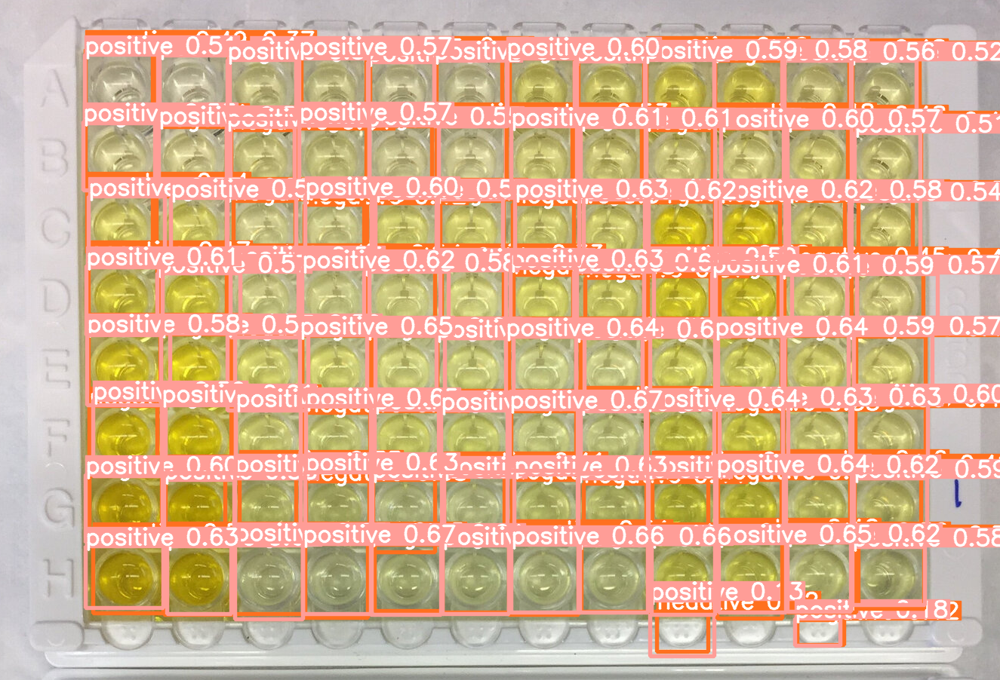

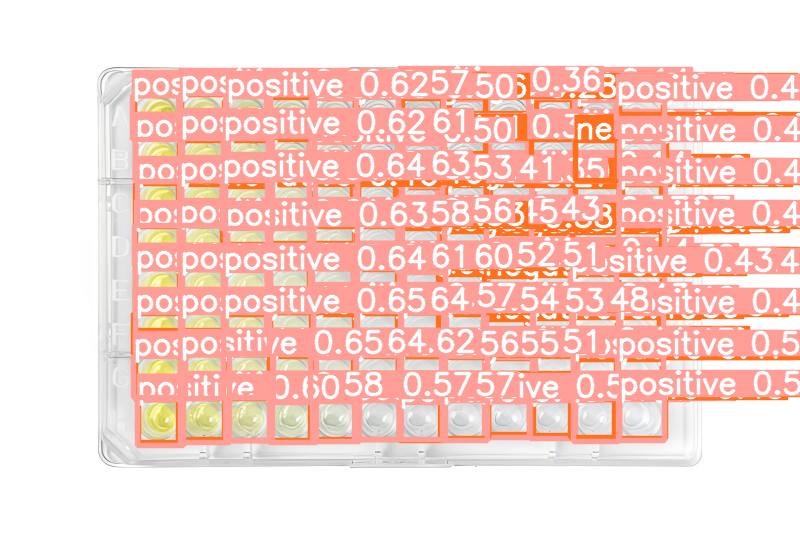

In [ ]:
# display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.png'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
import os
os.getcwd()

'/content/yolov5'

In [ ]:
!python export.py --weights runs/train/exp/weights/best.pt --include saved_model pb tflite

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['saved_model', 'pb', 'tflite']
YOLOv5 🚀 v7.0-315-g892e8a82 Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 8) (13.8 MB)
2024-05-29 12:33:46.130462: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-29 12:33:46.130529: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory